# Sodium LGS

> Simulate a sodium LGS beacon

In [ ]:
#| hide
from fastcore.test import test_close

Import the `LGSSystem` class from the pylgs module:

In [ ]:
from pylgs.lgssystem import LGSSystem
import numpy as np
import pymor

Define an LGS system on the D$_2$ line with pump and repump beams, with all parameters fixed except for the light intensities and the magnetic-field strength:

In [ ]:
lgs = LGSSystem(
    'NaD2_Repump', 
    {
        'EllipticityDegrees1': 45.,
        'PolarizationAngleDegrees1': 0,
        'DetuningHz1': 1.0832e9,
        'LaserWidthHz1': 10.0e6,
        'EllipticityDegrees2': 45.,
        'PolarizationAngleDegrees2': 0,
        'DetuningHz2': -6.268e8,
        'LaserWidthHz2': 10.0e6,
        'MagneticZenithDegrees': 45.,
        'MagneticAzimuthDegrees': 45.,
        'SDampingCollisionRatePerS': 4081.63,
        'BeamTransitRatePerS': 131.944,
        'VccRatePerS': 28571.,
        'TemperatureK': 185.,
        'RecoilParameter': 1
    }
)

The model contains equations for 374 density-matrix elements:

In [ ]:
lgs.A_ind.range

XarrayVectorSpace(
    coords=Coordinates:
             * Density matrix (range)  (Density matrix (range)) <U68 102kB 'ρ<sub>Re, (3...,
    name='A_ind')

Define sample values for the variable parameters:

In [ ]:
params = {'IntensitySI1': 5., 'IntensitySI2': 46., 'BFieldG': 0.5}

## Steady state of a cw LGS

### Evenly spaced velocity groups

Build a model for the steady state of a cw LGS with 200 evenly spaced velocity groups:

In [ ]:
model = lgs.stationary_model(vg=200)

Find the steady-state return flux:

In [ ]:
model.total_flux(params).item()

13625.272716874997

In [ ]:
#| hide
test_close(_, 13625.272716872452)

Find the density matrix for each of the 200 velocity groups:

In [ ]:
sol = model.solve(params)
sol

XarrayVectorArray(
    XarrayVectorSpace(
        coords=Coordinates:
                 * Atomic velocity          (Atomic velocity) float64 2kB -2.985 ... 2.985
                 * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    XarrayVectorArrayImpl(
        <xarray.DataArray (Atomic velocity: 200, Density matrix (source): 374)> Size: 598kB
        array([[ 4.39821068e-07,  1.36790177e-07, -1.36692321e-07, ...,
                 4.11349144e-11,  2.15032872e-13,  3.90994055e-14],
               [ 5.25623913e-07,  1.63475951e-07, -1.63358599e-07, ...,
                 4.96457736e-11,  2.62099026e-13,  4.73161298e-14],
               [ 6.27017092e-07,  1.95009305e-07, -1.94868944e-07, ...,
                 5.98154566e-11,  3.18954101e-13,  5.71688830e-14],
               ...,
               [ 6.25164410e-07,  1.95204724e-07, -1.95037891e-07, ...,
                -6.26906953e-11,  3.50162805e-13,  6.07662763e-14],
               [ 5.24087350e-07,  1.63638215e-07, -1.63498914e-07, ...,
                -5.20072807e-11,  2.87471480e-13,  5.02407845e-14],
               [ 4.38562334e-07,  1.36929724e-07, -1.36813610e-07, ...,
                -4.30715617e-11,  2.35630673e-13,  4.14736916e-14]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 2kB -2.985 ... 2.985
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...,
        <xarray.DataArray (Atomic velocity: 200, Density matrix (source): 374)> Size: 598kB
        array([[0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               ...,
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 2kB -2.985 ... 2.985
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    _len=1)

The result is expressed as an `XarrayVectorArray` object representing 200 vectors each of size 374. The `XarrayVectorArray` is a wrapper for an xarray `DataArray`, which can be accessed via the `XarrayVectorArray.array` attribute:

In [ ]:
sol.array

<xarray.DataArray (Atomic velocity: 200, Density matrix (source): 374)> Size: 598kB
array([[ 4.39821068e-07,  1.36790177e-07, -1.36692321e-07, ...,
         4.11349144e-11,  2.15032872e-13,  3.90994055e-14],
       [ 5.25623913e-07,  1.63475951e-07, -1.63358599e-07, ...,
         4.96457736e-11,  2.62099026e-13,  4.73161298e-14],
       [ 6.27017092e-07,  1.95009305e-07, -1.94868944e-07, ...,
         5.98154566e-11,  3.18954101e-13,  5.71688830e-14],
       ...,
       [ 6.25164410e-07,  1.95204724e-07, -1.95037891e-07, ...,
        -6.26906953e-11,  3.50162805e-13,  6.07662763e-14],
       [ 5.24087350e-07,  1.63638215e-07, -1.63498914e-07, ...,
        -5.20072807e-11,  2.87471480e-13,  5.02407845e-14],
       [ 4.38562334e-07,  1.36929724e-07, -1.36813610e-07, ...,
        -4.30715617e-11,  2.35630673e-13,  4.14736916e-14]])
Coordinates:
  * Atomic velocity          (Atomic velocity) float64 2kB -2.985 ... 2.985
  * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...

Use the density-matrix solution to find the velocity distribution of flux as an `XarrayVectorArray`:

In [ ]:
flux = model.flux_distribution(sol)
flux

XarrayVectorArray(
    XarrayVectorSpace(
        coords=Coordinates:
                 * Atomic velocity  (Atomic velocity) float64 2kB -2.985 -2.955 ... 2.955 2.985
                 * Transition       (Transition) <U33 132B '3P<sub>3/2</sub>→3S<sub>1/2</sub>',
        name='Flux'),
    XarrayVectorArrayImpl(
        <xarray.DataArray 'Flux' (Transition: 1, Atomic velocity: 200)> Size: 2kB
        array([[1.45155026e-03, 1.75836755e-03, 2.12665532e-03, 2.56805533e-03,
                3.09623799e-03, 3.72725119e-03, 4.47991603e-03, 5.37626359e-03,
                6.44203456e-03, 7.70725892e-03, 9.20691351e-03, 1.09816594e-02,
                1.30786975e-02, 1.55527335e-02, 1.84670488e-02, 2.18947487e-02,
                2.59201397e-02, 3.06402934e-02, 3.61667998e-02, 4.26277622e-02,
                5.01699596e-02, 5.89613681e-02, 6.91939258e-02, 8.10865713e-02,
                9.48887393e-02, 1.10884197e-01, 1.29395235e-01, 1.50787473e-01,
                1.75475135e-01, 2.03926747e-01, 2.36671723e-01, 2.74307521e-01,
                3.17507365e-01, 3.67029185e-01, 4.23725322e-01, 4.88552895e-01,
                5.62585946e-01, 6.47028583e-01, 7.43228891e-01, 8.52695476e-01,
                9.77115270e-01, 1.11837239e+00, 1.27857076e+00, 1.46005849e+00,
                1.66545367e+00, 1.89767593e+00, 2.15997935e+00, 2.45599033e+00,
                2.78974995e+00, 3.16576267e+00, 3.58904813e+00, 4.06520456e+00,
                4.60047826e+00, 5.20184075e+00, 5.87708243e+00, 6.63491718e+00,
                7.48510029e+00, 8.43857221e+00, 9.50762119e+00, 1.07060714e+01,
                1.20495111e+01, 1.35555559e+01, 1.52441630e+01, 1.71380062e+01,
                1.92629265e+01, 2.16484706e+01, 2.43285492e+01, 2.73422358e+01,
                3.07347452e+01, 3.45586447e+01, 3.88753558e+01, 4.37570324e+01,
                4.92889332e+01, 5.55724330e+01, 6.27288809e+01, 7.09046023e+01,
                8.02774252e+01, 9.10653104e+01, 1.03537886e+02, 1.18032071e+02,
        ...
                1.20324093e+02, 1.05499012e+02, 9.27447867e+01, 8.17172638e+01,
                7.21404430e+01, 6.37908801e+01, 5.64860882e+01, 5.00758121e+01,
                4.44353956e+01, 3.94606902e+01, 3.50641081e+01, 3.11715352e+01,
                2.77199028e+01, 2.46552544e+01, 2.19311989e+01, 1.95076690e+01,
                1.73499092e+01, 1.54276537e+01, 1.37144494e+01, 1.21870991e+01,
                1.08251963e+01, 9.61074123e+00, 8.52781614e+00, 7.56230997e+00,
                6.70169064e+00, 5.93480623e+00, 5.25171641e+00, 4.64355006e+00,
                4.10237967e+00, 3.62111271e+00, 3.19340154e+00, 2.81355734e+00,
                2.47648152e+00, 2.17760246e+00, 1.91282030e+00, 1.67845669e+00,
                1.47121296e+00, 1.28813113e+00, 1.12655840e+00, 9.84117720e-01,
                8.58679783e-01, 7.48337647e-01, 6.51385348e-01, 5.66297604e-01,
                4.91711380e-01, 4.26410139e-01, 3.69308835e-01, 3.19440703e-01,
                2.75945244e-01, 2.38057459e-01, 2.05097802e-01, 1.76463561e-01,
                1.51620769e-01, 1.30096834e-01, 1.11474166e-01, 9.53842371e-02,
                8.15021649e-02, 6.95420455e-02, 5.92526041e-02, 5.04132688e-02,
                4.28307590e-02, 3.63359478e-02, 3.07810337e-02, 2.60370835e-02,
                2.19917905e-02, 1.85474614e-02, 1.56192715e-02, 1.31336827e-02,
                1.10270288e-02, 9.24429541e-03, 7.73801847e-03, 6.46730608e-03,
                5.39699619e-03, 4.49690176e-03, 3.74114559e-03, 3.10758722e-03,
                2.57731324e-03, 2.13419408e-03, 1.76449810e-03, 1.45655500e-03]])
        Coordinates:
          * Transition       (Transition) <U33 132B '3P<sub>3/2</sub>→3S<sub>1/2</sub>'
          * Atomic velocity  (Atomic velocity) float64 2kB -2.985 -2.955 ... 2.955 2.985,
        <xarray.DataArray 'Flux' (Atomic velocity: 200, Transition: 1)> Size: 2kB
        array([[0.],
               [0.],
               [0.],
               [0.],
               [0.],
       

`XarrayVectorArray` objects have built-in visualization routines. Plot the velocity distribution of return flux:

In [ ]:
model.flux_distribution(sol).visualize(xaxis_range=(-.5, .5))

Plot the level population distribution:

In [ ]:
model.level_population_distribution(sol).visualize()

### Adaptive refinement of velocity groups

Build a steady-state model with each velocity group contributing no more than 2% of the return flux:

In [ ]:
model = lgs.adaptive_stationary_model(params, max_weight=0.02)

Find the total flux for this model:

In [ ]:
model.total_flux(params).item()

13521.857748247301

In [ ]:
#| hide
test_close(_, 13521.857748)

Find the density matrix. In this case the adaptive refinement has produced 82 velocity groups:

In [ ]:
sol = model.solve(params)
sol

XarrayVectorArray(
    XarrayVectorSpace(
        coords=Coordinates:
                 * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
                 * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    XarrayVectorArrayImpl(
        <xarray.DataArray (Atomic velocity: 82, Density matrix (source): 374)> Size: 245kB
        array([[ 4.44509987e-04,  1.36091065e-04, -1.35996356e-04, ...,
                 5.04360789e-08,  3.13451755e-10,  5.04876166e-11],
               [ 1.45887644e-02,  4.46721881e-03, -4.46295846e-03, ...,
                 2.70911705e-06,  2.75753934e-08,  3.64921627e-09],
               [ 1.26044901e-02,  3.86769079e-03, -3.86086340e-03, ...,
                 3.88704045e-06,  6.57921156e-08,  7.98942330e-09],
               ...,
               [ 1.24522728e-02,  3.87768808e-03, -3.86836038e-03, ...,
                -4.56188188e-06,  9.01969217e-08,  1.08025381e-08],
               [ 1.45005034e-02,  4.47569168e-03, -4.47011036e-03, ...,
                -2.97033915e-06,  3.30992900e-08,  4.28594967e-09],
               [ 4.43024269e-04,  1.36270803e-04, -1.36153882e-04, ...,
                -5.32867927e-08,  3.49647066e-10,  5.46598091e-11]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...,
        <xarray.DataArray (Atomic velocity: 82, Density matrix (source): 374)> Size: 245kB
        array([[0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               ...,
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    _len=1)

The flux distribution shows that this is a more detailed description of the system than the model with a greater number of evenly spaced velocity groups:

In [ ]:
model.flux_distribution(sol).visualize(xaxis_range=(-.5, .5))

### Dependence on system parameters

Find the steady-state density matrix for 10 different values of repump intensity, with the total pump + repump intensity held constant:

In [ ]:
sol = model.solve([
    {'BFieldG': .5},
    {
        'IntensitySI1': np.linspace(0, 25, 10), 
        'IntensitySI2': 50 - np.linspace(0, 25, 10)
    }
])
sol

XarrayVectorArray(
    XarrayVectorSpace(
        coords=Coordinates:
                 * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
                 * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    XarrayVectorArrayImpl(
        <xarray.DataArray (IntensitySI1: 10, Atomic velocity: 82,
                           Density matrix (source): 374)> Size: 2MB
        array([[[ 2.84741849e-04,  7.60632978e-05, -7.60110997e-05, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 9.34061270e-03,  2.49835307e-03, -2.49584959e-03, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 8.05861522e-03,  2.16697092e-03, -2.16267742e-03, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                ...,
                [ 7.96427320e-03,  2.17609078e-03, -2.17017690e-03, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 9.28659942e-03,  2.50480555e-03, -2.50147367e-03, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 2.83838079e-04,  7.61913883e-05, -7.61254763e-05, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

               [[ 4.01698906e-04,  1.20402789e-04, -1.20313940e-04, ...,
                  4.17564183e-08,  2.59508094e-10,  3.09733408e-11],
                [ 1.31811455e-02,  3.95223867e-03, -3.94826760e-03, ...,
                  2.24335865e-06,  2.28344135e-08,  2.24631086e-09],
                [ 1.13815087e-02,  3.42174940e-03, -3.41544295e-03, ...,
                  3.22055495e-06,  5.45105933e-08,  4.92852998e-09],
        ...
                [ 1.76007096e-02,  5.72239440e-03, -5.71485715e-03, ...,
                 -6.30234916e-06,  1.24606678e-07,  3.15669190e-08],
                [ 2.04089988e-02,  6.60686334e-03, -6.60292670e-03, ...,
                 -4.12235528e-06,  4.59360646e-08,  1.26554400e-08],
                [ 6.22588747e-04,  2.01194489e-04, -2.01123269e-04, ...,
                 -7.40494637e-08,  4.85881032e-10,  1.63604139e-10]],

               [[ 6.43985672e-04,  2.08149736e-04, -2.08105510e-04, ...,
                  7.04584916e-08,  4.37889557e-10,  1.61340412e-10],
                [ 2.11471513e-02,  6.83282102e-03, -6.83033108e-03, ...,
                  3.77328843e-06,  3.84075594e-08,  1.14886160e-08],
                [ 1.83094758e-02,  5.91545998e-03, -5.91046665e-03, ...,
                  5.37081853e-06,  9.09074102e-08,  2.48009540e-08],
                ...,
                [ 1.81826725e-02,  5.92391159e-03, -5.91694705e-03, ...,
                 -6.34100520e-06,  1.25371006e-07,  3.36839135e-08],
                [ 2.10739187e-02,  6.84013791e-03, -6.83658934e-03, ...,
                 -4.15204507e-06,  4.62669228e-08,  1.35143578e-08],
                [ 6.42757269e-04,  2.08306434e-04, -2.08244240e-04, ...,
                 -7.46058875e-08,  4.89532207e-10,  1.74651258e-10]]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...
          * IntensitySI1             (IntensitySI1) float64 80B 0.0 2.778 ... 22.22 25.0,
        <xarray.DataArray (Atomic velocity: 82, Density matrix (source): 374)> Size: 245kB
        array([[0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               ...,
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    _len=10)

Plot the total flux to show the optimal value of repump intensity for these conditions:

In [ ]:
model.total_flux(sol).visualize()

Create an animation of the flux distribution as the repump intensity is varied:

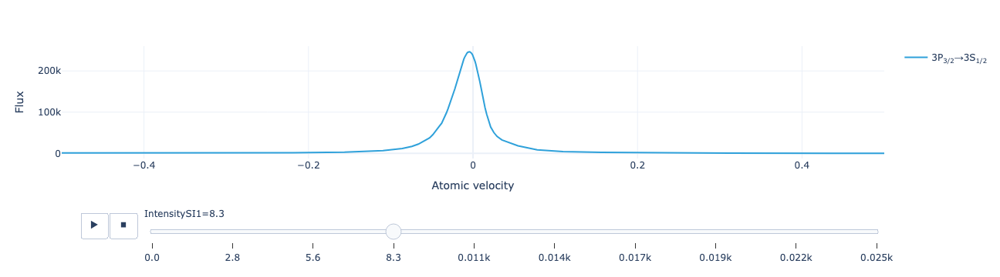

In [ ]:
model.flux_distribution(sol).visualize(xaxis_range=(-.5, .5))

Animate the level population distribution as a function of repump intensity:

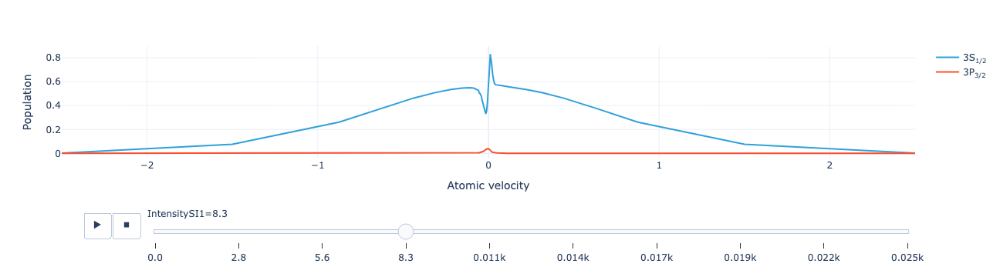

In [ ]:
model.level_population_distribution(sol).visualize()

## Transient dynamics

### Transient dynamics from a laser pulse

Build a dynamical model (`InstationaryModel`) using the velocity groups from the adaptively refined steady-state model:

In [ ]:
model = lgs.instationary_model(
    vg=model.data['velocity_groups'], 
    T=1e-5, 
    num_values=100
)

Set tolerances for the BDF solver:

In [ ]:
pymor.basic.set_defaults({
    'pylgs.pymor.timestepping.cvode_solver_options.cvode_bdf_atol': 1e-6,
    'pylgs.pymor.timestepping.cvode_solver_options.cvode_bdf_rtol': 1e-4,
})

Solve for the density-matrix evolution. The solution contains the density matrix for each velocity group at 100 time values:

In [ ]:
sol = model.solve(params)
sol

FloatProgress(value=0.0, bar_style='info', max=1e-05)

XarrayVectorArray(
    XarrayVectorSpace(
        coords=Coordinates:
                 * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
                 * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    XarrayVectorArrayImpl(
        <xarray.DataArray (Time: 100, Atomic velocity: 82, Density matrix (source): 374)> Size: 25MB
        array([[[ 2.90977780e-04,  0.00000000e+00,  0.00000000e+00, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 9.53884200e-03,  0.00000000e+00,  0.00000000e+00, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 8.22157246e-03,  0.00000000e+00,  0.00000000e+00, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                ...,
                [ 8.22157246e-03,  0.00000000e+00,  0.00000000e+00, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 9.53884200e-03,  0.00000000e+00,  0.00000000e+00, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
                [ 2.90977780e-04,  0.00000000e+00,  0.00000000e+00, ...,
                  0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

               [[ 2.90984377e-04,  7.93075395e-10,  6.86626564e-10, ...,
                  1.03179825e-07,  6.41182997e-10,  9.79932056e-11],
                [ 9.53921226e-03,  4.62203048e-08,  4.01056581e-08, ...,
                  5.53912084e-06,  5.63722876e-08,  7.28739798e-09],
                [ 8.22227913e-03,  9.16998781e-08,  7.93413806e-08, ...,
                  7.93666011e-06,  1.34300580e-07,  1.61607768e-08],
        ...
                [ 8.33710150e-03,  1.29565146e-04, -1.11430984e-04, ...,
                 -9.39712116e-06,  1.85861573e-07,  2.20966238e-08],
                [ 9.65773723e-03,  1.31599716e-04, -1.14786059e-04, ...,
                 -6.12416112e-06,  6.82567342e-08,  8.64647789e-09],
                [ 2.94451510e-04,  3.83926466e-06, -3.36131886e-06, ...,
                 -1.09897247e-07,  7.21193041e-10,  1.06866674e-10]],

               [[ 2.94412841e-04,  4.00158624e-06, -3.33812398e-06, ...,
                  1.04078484e-07,  6.46783053e-10,  9.82980208e-11],
                [ 9.65777106e-03,  1.36914807e-04, -1.13201976e-04, ...,
                  5.59095210e-06,  5.69011891e-08,  7.33776999e-09],
                [ 8.34075742e-03,  1.32513674e-04, -1.07233209e-04, ...,
                  8.02434420e-06,  1.35787878e-07,  1.63245571e-08],
                ...,
                [ 8.33564769e-03,  1.34487328e-04, -1.11143179e-04, ...,
                 -9.39939422e-06,  1.85907098e-07,  2.21024129e-08],
                [ 9.65611775e-03,  1.36770644e-04, -1.14601176e-04, ...,
                 -6.12542746e-06,  6.82710430e-08,  8.64850263e-09],
                [ 2.94401527e-04,  3.99173268e-06, -3.35769918e-06, ...,
                 -1.09918905e-07,  7.21337186e-10,  1.06892711e-10]]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...
          * Time                     (Time) float64 800B 0.0 1.01e-07 ... 1e-05,
        <xarray.DataArray (Atomic velocity: 82, Density matrix (source): 374)> Size: 245kB
        array([[0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               ...,
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.],
               [0., 0., 0., ..., 0., 0., 0.]])
        Coordinates:
          * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    _len=100)

Plot the total flux as a function of time:

In [ ]:
model.total_flux(sol).visualize()

Animate the flux distribution as a function of time:

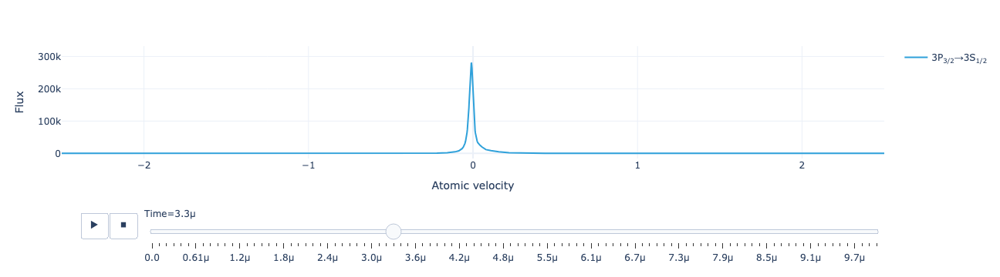

In [ ]:
model.flux_distribution(sol).visualize()

Animate the level population distribution:

In [ ]:
model.level_population_distribution(sol).visualize(xaxis_range=(-1, 1))

### Transient dynamics with modulated laser intensity

Solve the `InstationaryModel` with sinusoidally modulated light intensity:

In [ ]:
sol = model.solve({
    'IntensitySI1': "5.*sin(1e6*t)**2", 
    'IntensitySI2': "46.*sin(1e6*t)**2",
    'BFieldG': .5
})

FloatProgress(value=0.0, bar_style='info', max=1e-05)

The total flux as a function of time:

In [ ]:
model.total_flux(sol).visualize()

The animated flux distribution:

In [ ]:
model.flux_distribution(sol).visualize(xaxis_range=(-.25, .25))

The animated level population distribution:

In [ ]:
model.level_population_distribution(sol).visualize(xaxis_range=(-.25, .25))

## Periodic state of a modulated system

The `StationaryFloquetModel` solves for the periodic state of a modulated system after the transient dynamics have died out.

Build a stationary Floquet model for six Fourier harmonics of a system with sinusoidally modulated intensity:

In [ ]:
model = lgs.stationary_floquet_model(
    {
        'IntensitySI1': "5.*sin(nu*t)**2", 
        'IntensitySI2': "46.*sin(nu*t)**2"
    },
    T=np.linspace(0, 1e-5, 100),
    n_vector=6,
    vg=model.data['velocity_groups']
)

Define values for the modulation frequency and magnetic field:

In [ ]:
mu = {'nu': 1e6, 'BFieldG': .5}

Solve for the periodic state. The solution contains 13 Fourier coefficients for each density-matrix element in each velocity group:

In [ ]:
sol = model.solve(mu)
sol

XarrayVectorArray(
    XarrayVectorSpace(
        coords=Coordinates:
                 * Fourier coefficient      (Fourier coefficient) int64 104B -6 -5 -4 ... 4 5 6
                 * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
                 * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...),
    XarrayVectorArrayImpl(
        <xarray.DataArray (Fourier coefficient: 13, Atomic velocity: 82,
                           Density matrix (source): 374)> Size: 6MB
        array([[[-3.65749405e-09-3.46761782e-09j,
                 -3.96353685e-09+4.94087982e-09j,
                 -3.17237114e-09+1.11846616e-09j, ...,
                  1.03381620e-12-8.16309510e-13j,
                  6.82639591e-15-4.58286794e-15j,
                  9.36100333e-13-8.58192808e-14j],
                [-1.70383182e-07-1.27463212e-07j,
                 -1.30509336e-07+2.28019037e-07j,
                 -1.15551645e-07+9.77772014e-08j, ...,
                  3.28482728e-11-4.27813112e-11j,
                  3.68837693e-13-4.11150694e-13j,
                  6.84717881e-11-4.66919676e-12j],
                [-2.34577481e-07-1.43038349e-07j,
                 -1.16433708e-07+3.06682602e-07j,
                 -1.21048732e-07+1.85521925e-07j, ...,
                 -5.56001163e-12-6.29211675e-11j,
                 -9.68135735e-15-1.07974392e-12j,
                  1.50730465e-10-8.53212720e-12j],
                ...,
                [ 7.04161953e-08-1.29882845e-07j,
        ...
                  1.50730465e-10+8.53212720e-12j],
                ...,
                [ 7.04161953e-08+1.29882845e-07j,
                 -1.36580958e-07+1.21111963e-07j,
                 -6.26390712e-08+2.17822772e-07j, ...,
                 -3.68210263e-10-1.42509438e-10j,
                  7.50429138e-12+2.23349383e-12j,
                  2.03747444e-10+1.11802265e-11j],
                [ 3.61301320e-08+1.16935656e-07j,
                 -1.43340879e-07+6.24707270e-08j,
                 -7.52836042e-08+1.75166112e-07j, ...,
                 -1.78005632e-10-7.06295097e-11j,
                  2.04591063e-12+6.28806819e-13j,
                  8.05189609e-11+5.26892728e-12j],
                [ 1.21960059e-10+3.27123185e-09j,
                 -4.19413518e-09+3.82423745e-10j,
                 -2.43151923e-09+3.87556607e-09j, ...,
                 -2.61928027e-12-1.10962540e-12j,
                  1.77627008e-14+5.91667923e-15j,
                  1.01513846e-12+8.97497100e-14j]]])
        Coordinates:
          * Fourier coefficient      (Fourier coefficient) int64 104B -6 -5 -4 ... 4 5 6
          * Atomic velocity          (Atomic velocity) float64 656B -2.5 -1.5 ... 2.5
          * Density matrix (source)  (Density matrix (source)) <U68 102kB 'ρ<sub>Re, ...,
        <xarray.DataArray (Fourier coefficient: 13, Atomic velocity: 82,
                           Density matrix (source): 374)> Size: 3MB
        array([[[0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                ...,
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.]],

               [[0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                ...,
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.]],

               [[0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                ...,
        ...
                ...,
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.]],

               [[0., 0., 0., ..., 0., 0., 0.],
                [0., 0., 0., ..., 0., 0., 0.],
             

The real and imaginary parts of the Fourier coefficients of the time-dependent return flux:

In [ ]:
model.total_flux(sol).visualize()

The total return flux reconstructed as a function of time:

In [ ]:
model.reconstructed_total_flux(sol, mu).real.visualize()

The level population distribution as a function of time:

In [ ]:
model.level_population_distribution(model.reconstruct(sol, mu)).real.visualize()